## Week 6 Midterm

### Research Question
I am exploring the interactions between the processes of gentrification and tourism in San Juan, Puerto Rico, with an emphasis on Santurce. 

### Data sources

I have identified the American Community Survey (ACS) as a data source, as it contains gentrification indicators like rental markets and household income. I have worked with that data a bit in my past homework assignments, and I plan to run a bit of it here too. I have also gained access to geodata for the hotels in Puerto Rico (data from the government), and I plan to explore it here as well. 

I am first going to call my data. Now that I've revised my homework 5, I see I downloaded it as cvs and should have done it as geojson! So I'm about to run it in the latter.

In [1]:
import pandas as pd

In [2]:
# to read and visualize spatial data
import geopandas as gpd

# to provide basemaps 
import contextily as ctx

# to plot
import matplotlib.pyplot as plt

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [3]:
#Now I'm calling my data
df = gpd.read_file('acs2019_san juan_household_income.geojson')

### Data Exploration

In [4]:
#rows and columns
df.shape

(365, 37)

In [5]:
# first five rows, but not all columns
df.head()

,geoid,name,B19001001,"B19001001, Error",B19001002,"B19001002, Error",B19001003,"B19001003, Error",B19001004,"B19001004, Error",...,"B19001013, Error",B19001014,"B19001014, Error",B19001015,"B19001015, Error",B19001016,"B19001016, Error",B19001017,"B19001017, Error",geometry
0,15000US721270004001,"Block Group 1, San Juan, PR",384.0,83.0,191.0,67.0,54.0,45.0,36.0,34.0,...,14.0,0.0,14.0,0.0,14.0,0.0,14.0,0.0,14.0,"MULTIPOLYGON (((-66.11862 18.46914, -66.11834 ..."
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,71.0,69.0,32.0,44.0,36.0,14.0,15.0,...,11.0,7.0,11.0,26.0,30.0,18.0,22.0,14.0,22.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,86.0,66.0,38.0,11.0,15.0,54.0,36.0,...,18.0,0.0,14.0,0.0,14.0,10.0,15.0,21.0,23.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,104.0,45.0,40.0,69.0,55.0,31.0,35.0,...,31.0,55.0,42.0,0.0,14.0,13.0,14.0,39.0,28.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,64.0,152.0,61.0,44.0,36.0,10.0,17.0,...,14.0,0.0,14.0,0.0,14.0,0.0,14.0,0.0,14.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."


In [6]:
#pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [9]:
df.sample()

,geoid,name,B19001001,"B19001001, Error",B19001002,"B19001002, Error",B19001003,"B19001003, Error",B19001004,"B19001004, Error",...,"B19001013, Error",B19001014,"B19001014, Error",B19001015,"B19001015, Error",B19001016,"B19001016, Error",B19001017,"B19001017, Error",geometry
167,15000US721270056023,"Block Group 3, San Juan, PR",713.0,120.0,346.0,107.0,65.0,50.0,70.0,53.0,...,16.0,0.0,14.0,0.0,14.0,0.0,14.0,0.0,14.0,"MULTIPOLYGON (((-66.03118 18.39970, -66.03100 ..."


In [8]:
#data types
df.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 37 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             365 non-null    object  
 1   name              365 non-null    object  
 2   B19001001         365 non-null    float64 
 3   B19001001, Error  365 non-null    float64 
 4   B19001002         365 non-null    float64 
 5   B19001002, Error  365 non-null    float64 
 6   B19001003         365 non-null    float64 
 7   B19001003, Error  365 non-null    float64 
 8   B19001004         365 non-null    float64 
 9   B19001004, Error  365 non-null    float64 
 10  B19001005         365 non-null    float64 
 11  B19001005, Error  365 non-null    float64 
 12  B19001006         365 non-null    float64 
 13  B19001006, Error  365 non-null    float64 
 14  B19001007         365 non-null    float64 
 15  B19001007, Error  365 non-null    float64 
 16  B19001008         

/tmp/ipykernel_54/4079988822.py:2: FutureWarning: null_counts is deprecated. Use show_counts instead
  df.info(verbose=True, null_counts=True)


<AxesSubplot:>

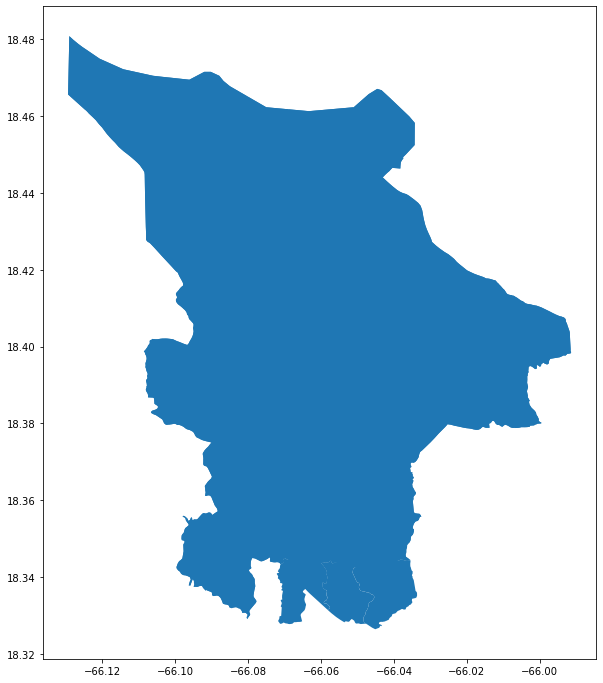

In [10]:
#There are quite some error columns that I need to eliminate. Let me plot it before and then I'll fix that.
df.plot(figsize=(12,12))

#### That's San Juan!

Okay, I'm going to eliminate what is problematic/don't need

In [11]:
# drop the first row
df = df.drop([0])

In [12]:
df.head()

,geoid,name,B19001001,"B19001001, Error",B19001002,"B19001002, Error",B19001003,"B19001003, Error",B19001004,"B19001004, Error",...,"B19001013, Error",B19001014,"B19001014, Error",B19001015,"B19001015, Error",B19001016,"B19001016, Error",B19001017,"B19001017, Error",geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,71.0,69.0,32.0,44.0,36.0,14.0,15.0,...,11.0,7.0,11.0,26.0,30.0,18.0,22.0,14.0,22.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,86.0,66.0,38.0,11.0,15.0,54.0,36.0,...,18.0,0.0,14.0,0.0,14.0,10.0,15.0,21.0,23.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,104.0,45.0,40.0,69.0,55.0,31.0,35.0,...,31.0,55.0,42.0,0.0,14.0,13.0,14.0,39.0,28.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,64.0,152.0,61.0,44.0,36.0,10.0,17.0,...,14.0,0.0,14.0,0.0,14.0,0.0,14.0,0.0,14.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,59.0,37.0,31.0,6.0,9.0,17.0,21.0,...,25.0,35.0,22.0,18.0,22.0,35.0,28.0,28.0,19.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [13]:
list(df)

['geoid',
 'name',
 'B19001001',
 'B19001001, Error',
 'B19001002',
 'B19001002, Error',
 'B19001003',
 'B19001003, Error',
 'B19001004',
 'B19001004, Error',
 'B19001005',
 'B19001005, Error',
 'B19001006',
 'B19001006, Error',
 'B19001007',
 'B19001007, Error',
 'B19001008',
 'B19001008, Error',
 'B19001009',
 'B19001009, Error',
 'B19001010',
 'B19001010, Error',
 'B19001011',
 'B19001011, Error',
 'B19001012',
 'B19001012, Error',
 'B19001013',
 'B19001013, Error',
 'B19001014',
 'B19001014, Error',
 'B19001015',
 'B19001015, Error',
 'B19001016',
 'B19001016, Error',
 'B19001017',
 'B19001017, Error',
 'geometry']

In [14]:
# columns to keep
columns_to_keep = ['geoid',
 'name',
 'B19001001',
 'B19001002',
 'B19001003',
 'B19001004',
 'B19001005',
 'B19001006',
 'B19001007',
 'B19001008',
 'B19001009',
 'B19001010',
 'B19001011',
 'B19001012',
 'B19001013',
 'B19001014',
 'B19001015',
 'B19001016',
 'B19001017',
 'geometry']

In [16]:
# redefine df with only columns to keep
df = df[columns_to_keep]

In [17]:
df.head()

,geoid,name,B19001001,B19001002,B19001003,B19001004,B19001005,B19001006,B19001007,B19001008,B19001009,B19001010,B19001011,B19001012,B19001013,B19001014,B19001015,B19001016,B19001017,geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,44.0,8.0,21.0,0.0,7.0,7.0,26.0,18.0,14.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,50.0,22.0,38.0,0.0,16.0,0.0,0.0,10.0,21.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,33.0,22.0,31.0,24.0,31.0,55.0,0.0,13.0,39.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,0.0,0.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,15.0,6.0,12.0,24.0,23.0,35.0,18.0,35.0,28.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [44]:
#Okay, looks better! Let's rename

In [18]:
list(df)

['geoid',
 'name',
 'B19001001',
 'B19001002',
 'B19001003',
 'B19001004',
 'B19001005',
 'B19001006',
 'B19001007',
 'B19001008',
 'B19001009',
 'B19001010',
 'B19001011',
 'B19001012',
 'B19001013',
 'B19001014',
 'B19001015',
 'B19001016',
 'B19001017',
 'geometry']

In [19]:
#Okay, I'll change the names using the data dictionary

In [27]:
df.columns = ['geoid',
 'name',
'Total',
'Less than $10,000',
'$10,000 to $14,999',
'$15,000 to $19,999',
'$20,000 to $24,999',
'$25,000 to $29,999',
'$30,000 to $34,999',
'$35,000 to $39,999',
'$40,000 to $44,999',
'$45,000 to $49,999',
'$50,000 to $59,999',
'$60,000 to $74,999',
'$75,000 to $99,999',
'$100,000 to $124,999',
'$125,000 to $149,999',
'$150,000 to $199,999',
'$200,000 or more',
 'geometry']

In [28]:
df.head()

,geoid,name,Total,"Less than $10,000","$10,000 to $14,999","$15,000 to $19,999","$20,000 to $24,999","$25,000 to $29,999","$30,000 to $34,999","$35,000 to $39,999","$40,000 to $44,999","$45,000 to $49,999","$50,000 to $59,999","$60,000 to $74,999","$75,000 to $99,999","$100,000 to $124,999","$125,000 to $149,999","$150,000 to $199,999","$200,000 or more",geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,44.0,8.0,21.0,0.0,7.0,7.0,26.0,18.0,14.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,50.0,22.0,38.0,0.0,16.0,0.0,0.0,10.0,21.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,33.0,22.0,31.0,24.0,31.0,55.0,0.0,13.0,39.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,0.0,0.0,29.0,0.0,0.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,15.0,6.0,12.0,24.0,23.0,35.0,18.0,35.0,28.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [29]:
#I want to see if the math adds up. Total should be the the sum of all the columns.
random_blockgroup = df.sample()
random_blockgroup

,geoid,name,Total,"Less than $10,000","$10,000 to $14,999","$15,000 to $19,999","$20,000 to $24,999","$25,000 to $29,999","$30,000 to $34,999","$35,000 to $39,999","$40,000 to $44,999","$45,000 to $49,999","$50,000 to $59,999","$60,000 to $74,999","$75,000 to $99,999","$100,000 to $124,999","$125,000 to $149,999","$150,000 to $199,999","$200,000 or more",geometry
203,15000US721270069004,"Block Group 4, San Juan, PR",317.0,100.0,21.0,24.0,33.0,25.0,18.0,0.0,8.0,0.0,21.0,33.0,34.0,0.0,0.0,0.0,0.0,"MULTIPOLYGON (((-66.08164 18.41138, -66.08150 ..."


<AxesSubplot:>

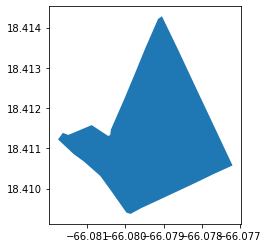

In [30]:
random_blockgroup.plot()

In [31]:
#using iloc to get the total population of our random record
# "for the 0th record, get the value in the Total column"
random_blockgroup.iloc[0]['Total']

317.0

In [32]:
# print this out in plain english
print('Total households: ' + str(random_blockgroup.iloc[0]['Total']))

Total households: 317.0


In [26]:
#It adds! 

### Charts

Before creating charts, I want to see some basic statistics to get a sense of the data.

In [33]:
#mean and median
df['Total'].mean()

762.25

In [34]:
df['Total'].median()

339.0

In [35]:
# get some stats
df['Total'].describe()

count       364.00000
mean        762.25000
std        7236.80388
min           0.00000
25%         244.75000
50%         339.00000
75%         488.00000
max      138385.00000
Name: Total, dtype: float64

<AxesSubplot:ylabel='Frequency'>

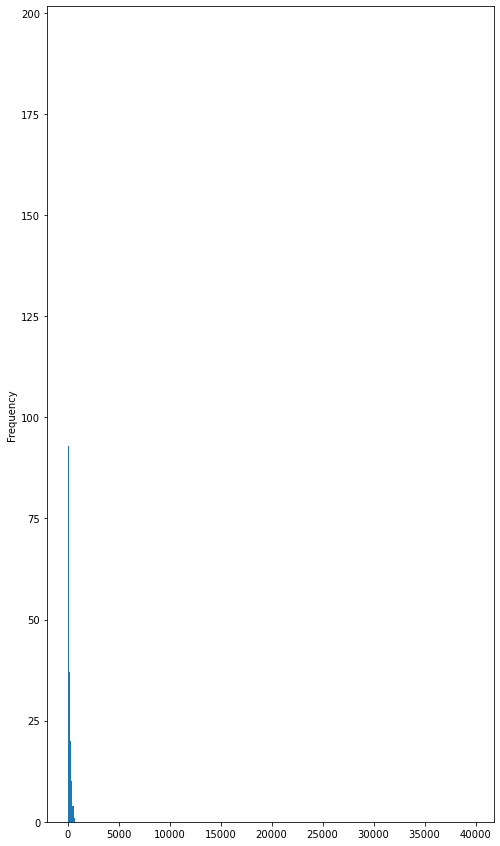

In [36]:
#histogram with 50 bins
df['Less than $10,000'].plot.hist(figsize=(8,15),bins=500)

Okay, so that explains how different  the mean and the median are. I wonder how I can change these scales to maybe see more variation.

NameError: name 'StrMethodFormatter' is not defined

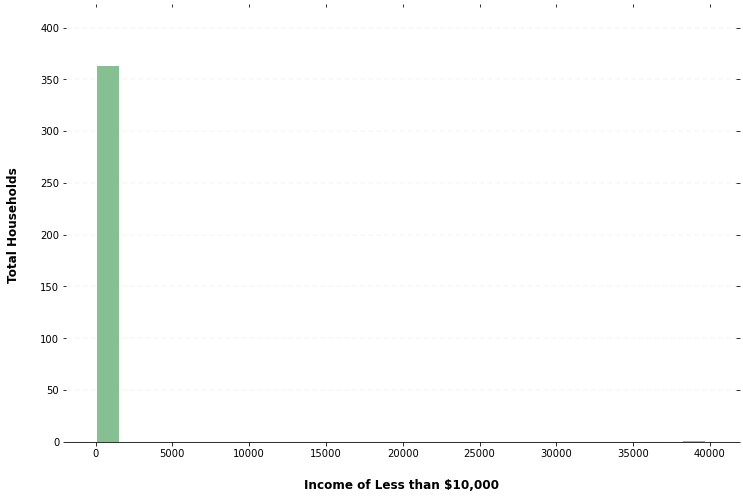

In [37]:
ax = df.hist(column='Less than $10,000', bins=25, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("")

    # Set x-axis label
    x.set_xlabel("Income of Less than $10,000", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Households", labelpad=20, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

This might not be the best way to represent the data... I'm going to do it with another column and move on.

NameError: name 'StrMethodFormatter' is not defined

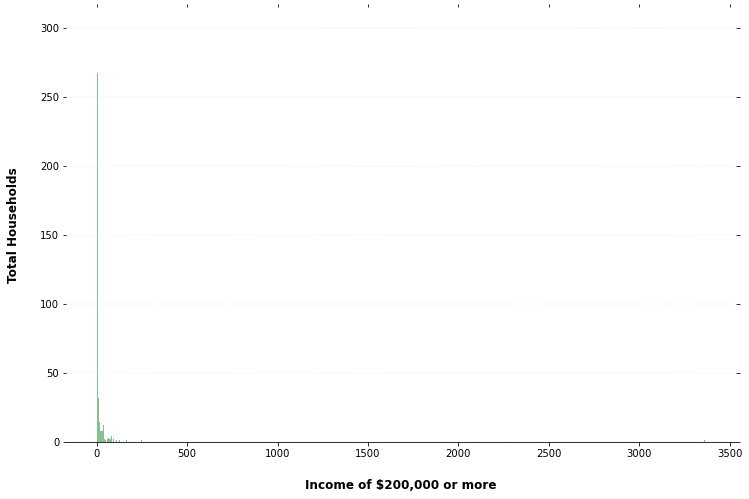

In [38]:
ax = df.hist(column='$200,000 or more', bins=500, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("")

    # Set x-axis label
    x.set_xlabel("Income of $200,000 or more", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Households", labelpad=20, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

Okay, what I did here was add more bins (number of buckets the data will be grouped by) to see more variation. It is a little more visible, but couuld be better.

#### Sorting

In [39]:
df_sorted = df.sort_values(by='Total',ascending = False)

In [40]:
df_sorted[['geoid','Total']].head(10)

,geoid,Total
364,16000US7276770,138385.0
199,15000US721270068001,2334.0
345,15000US721270100421,1100.0
316,15000US721270098005,1062.0
340,15000US721270100222,1023.0
334,15000US721270100022,1001.0
331,15000US721270100013,998.0
281,15000US721270091112,930.0
234,15000US721270080011,925.0
239,15000US721270080023,909.0


<AxesSubplot:>

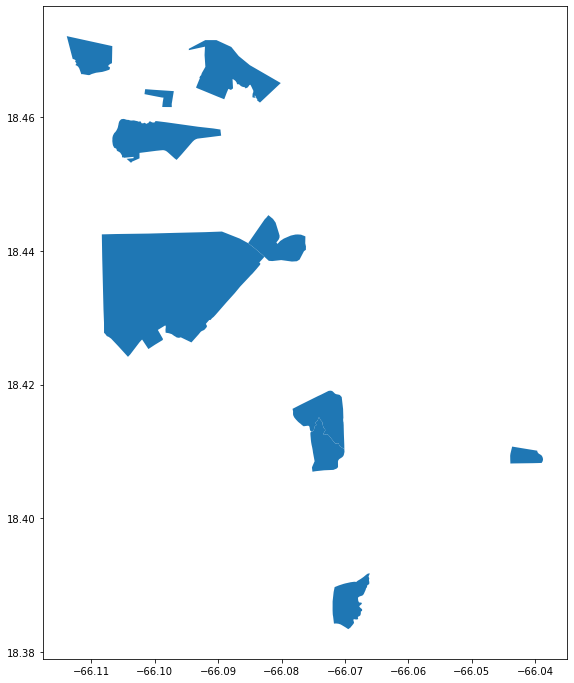

In [41]:
# plot it
df_sorted.tail(10).plot(figsize=(12,12))

<AxesSubplot:>

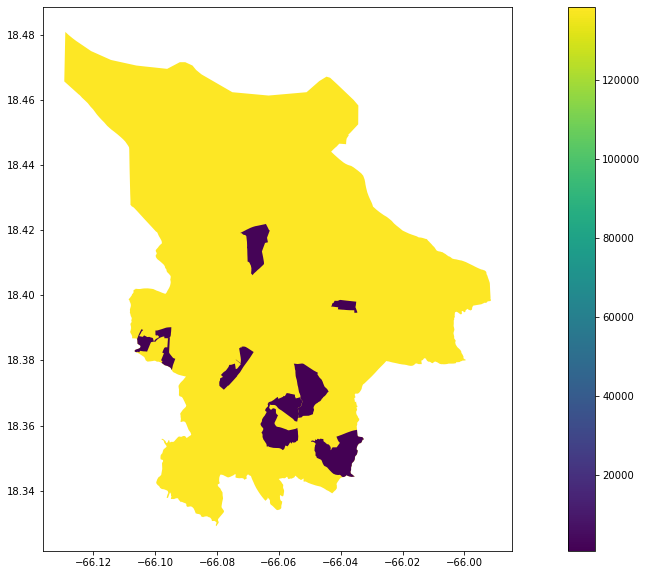

In [42]:
#Let me make this prettier
df_sorted.head(10).plot(figsize=(20,10),
                          column='Total',
                          legend=True)

#### Normalizing the data

In [43]:
# output columns
list(df)

['geoid',
 'name',
 'Total',
 'Less than $10,000',
 '$10,000 to $14,999',
 '$15,000 to $19,999',
 '$20,000 to $24,999',
 '$25,000 to $29,999',
 '$30,000 to $34,999',
 '$35,000 to $39,999',
 '$40,000 to $44,999',
 '$45,000 to $49,999',
 '$50,000 to $59,999',
 '$60,000 to $74,999',
 '$75,000 to $99,999',
 '$100,000 to $124,999',
 '$125,000 to $149,999',
 '$150,000 to $199,999',
 '$200,000 or more',
 'geometry']

In [44]:
#creating columns with normalized data
df['Percent Households with Less than $10,000']=df['Less than $10,000']/df['Total']*100

In [45]:
df['Percent Households with $10,000 to $14,999']=df['$10,000 to $14,999']/df['Total']*100

In [46]:
df['Percent Households with $15,000 to $19,999']=df['$15,000 to $19,999']/df['Total']*100

In [47]:
df['Percent Households with $20,000 to $24,999']=df['$20,000 to $24,999']/df['Total']*100

In [48]:
df['Percent Households with $25,000 to $29,999']=df['$25,000 to $29,999']/df['Total']*100

In [49]:
df['Percent Households with $30,000 to $34,999']=df['$30,000 to $34,999']/df['Total']*100

In [50]:
df['Percent Households with $35,000 to $39,999']=df['$35,000 to $39,999']/df['Total']*100

In [51]:
df['Percent Households with $40,000 to $44,999']=df['$40,000 to $44,999']/df['Total']*100

In [52]:
df['Percent Households with $45,000 to $49,999']=df['$45,000 to $49,999']/df['Total']*100

In [53]:
df['Percent Households with $50,000 to $59,999']=df['$50,000 to $59,999']/df['Total']*100

In [54]:
df['Percent Households with $60,000 to $74,999']=df['$60,000 to $74,999']/df['Total']*100

In [55]:
df['Percent Households with $75,000 to $99,999']=df['$75,000 to $99,999']/df['Total']*100

In [56]:
df['Percent Households with $100,000 to $124,999']=df['$100,000 to $124,999']/df['Total']*100

In [57]:
df['Percent Houselholds with $125,000 to $149,999']=df['$125,000 to $149,999']/df['Total']*100
df['Percent Households with $150,000 to $199,999']=df['$150,000 to $199,999']/df['Total']*100
df['Percent Households with $200,000 or more']=df['$200,000 or more']/df['Total']*100

I had run them all at the same time, but had an error, so I decided to run them one by one till I found what was wrong.Turns out I was missing the df before ['Total'] starting in 'Percent Houselholds with $125,000 to $149,999'. After I fixed that, I ran fine.

In [58]:
df.head()

,geoid,name,Total,"Less than $10,000","$10,000 to $14,999","$15,000 to $19,999","$20,000 to $24,999","$25,000 to $29,999","$30,000 to $34,999","$35,000 to $39,999",...,"Percent Households with $35,000 to $39,999","Percent Households with $40,000 to $44,999","Percent Households with $45,000 to $49,999","Percent Households with $50,000 to $59,999","Percent Households with $60,000 to $74,999","Percent Households with $75,000 to $99,999","Percent Households with $100,000 to $124,999","Percent Houselholds with $125,000 to $149,999","Percent Households with $150,000 to $199,999","Percent Households with $200,000 or more"
1,15000US721270004002,"Block Group 2, San Juan, PR",311.0,69.0,44.0,14.0,6.0,0.0,21.0,12.0,...,3.858521,14.147910,2.572347,6.752412,0.000000,2.250804,2.250804,8.360129,5.787781,4.501608
2,15000US721270005061,"Block Group 1, San Juan, PR",362.0,66.0,11.0,54.0,22.0,52.0,0.0,0.0,...,0.000000,13.812155,6.077348,10.497238,0.000000,4.419890,0.000000,0.000000,2.762431,5.801105
3,15000US721270005062,"Block Group 2, San Juan, PR",481.0,45.0,69.0,31.0,30.0,0.0,29.0,29.0,...,6.029106,6.860707,4.573805,6.444906,4.989605,6.444906,11.434511,0.000000,2.702703,8.108108
4,15000US721270006001,"Block Group 1, San Juan, PR",265.0,152.0,44.0,10.0,18.0,6.0,0.0,6.0,...,2.264151,0.000000,0.000000,10.943396,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,15000US721270006002,"Block Group 2, San Juan, PR",262.0,37.0,6.0,17.0,0.0,0.0,0.0,6.0,...,2.290076,5.725191,2.290076,4.580153,9.160305,8.778626,13.358779,6.870229,13.358779,10.687023


Looks good!

<AxesSubplot:>

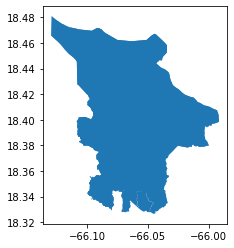

In [59]:
df.plot()

<AxesSubplot:ylabel='Frequency'>

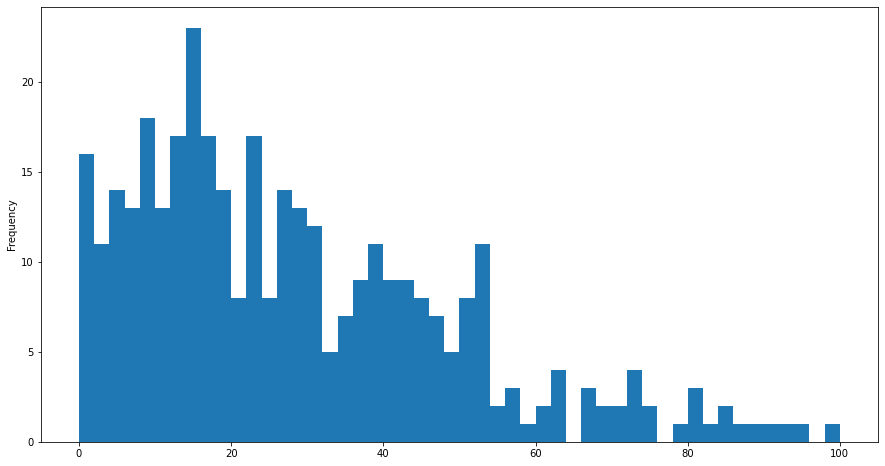

In [60]:
# plot it as a histogram with 50 bins
df['Percent Households with Less than $10,000'].plot.hist(figsize=(15,8),bins=50)

Look at that! That is way better than before!!

NameError: name 'StrMethodFormatter' is not defined

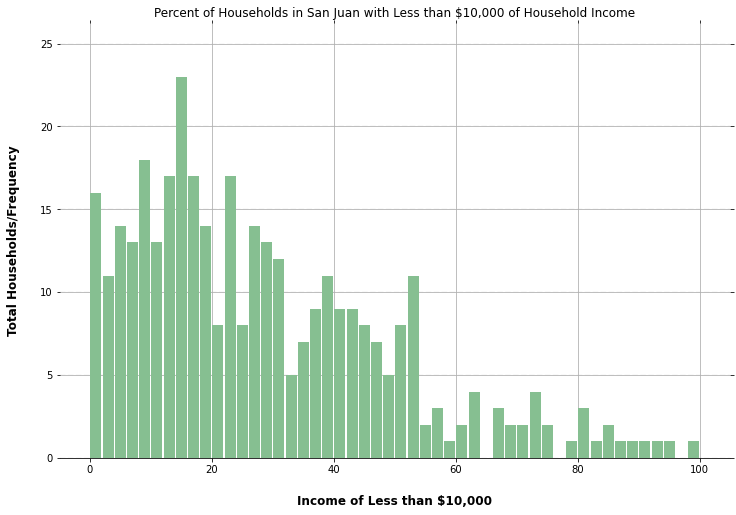

In [61]:
ax = df.hist(column='Percent Households with Less than $10,000', bins=50, grid=True, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)

ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="on")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Remove title
    x.set_title("Percent of Households in San Juan with Less than $10,000 of Household Income")

    # Set x-axis label
    x.set_xlabel("Income of Less than $10,000", labelpad=20, weight='bold', size=12)

    # Set y-axis label
    x.set_ylabel("Total Households/Frequency", labelpad=20, weight='bold', size=12)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

Thruthfully, I am still confused how to interpret this (might be the labels are wrong), but at least I can see more variation?

#### Maps

In [62]:
list(df)

['geoid',
 'name',
 'Total',
 'Less than $10,000',
 '$10,000 to $14,999',
 '$15,000 to $19,999',
 '$20,000 to $24,999',
 '$25,000 to $29,999',
 '$30,000 to $34,999',
 '$35,000 to $39,999',
 '$40,000 to $44,999',
 '$45,000 to $49,999',
 '$50,000 to $59,999',
 '$60,000 to $74,999',
 '$75,000 to $99,999',
 '$100,000 to $124,999',
 '$125,000 to $149,999',
 '$150,000 to $199,999',
 '$200,000 or more',
 'geometry',
 'Percent Households with Less than $10,000',
 'Percent Households with $10,000 to $14,999',
 'Percent Households with $15,000 to $19,999',
 'Percent Households with $20,000 to $24,999',
 'Percent Households with $25,000 to $29,999',
 'Percent Households with $30,000 to $34,999',
 'Percent Households with $35,000 to $39,999',
 'Percent Households with $40,000 to $44,999',
 'Percent Households with $45,000 to $49,999',
 'Percent Households with $50,000 to $59,999',
 'Percent Households with $60,000 to $74,999',
 'Percent Households with $75,000 to $99,999',
 'Percent Households wit

<AxesSubplot:>

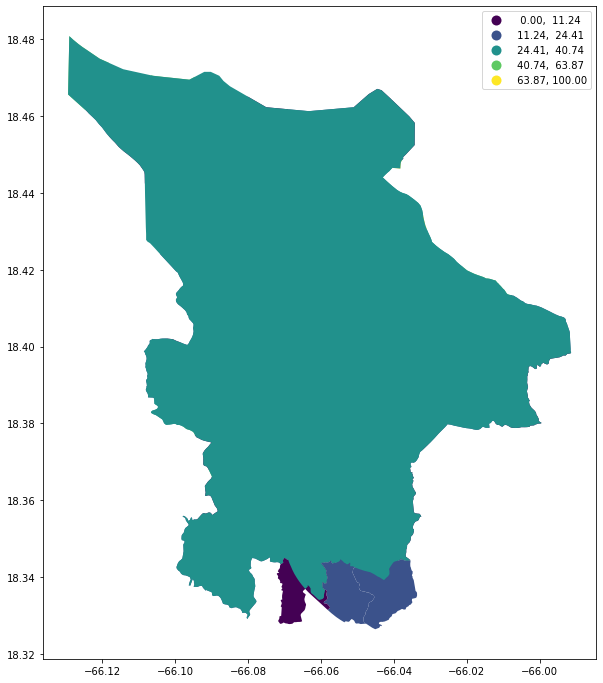

In [63]:
# natural breaks
df.plot(figsize=(12,12),
                 column='Percent Households with Less than $10,000',
                 legend=True, 
                 scheme='NaturalBreaks')

<AxesSubplot:>

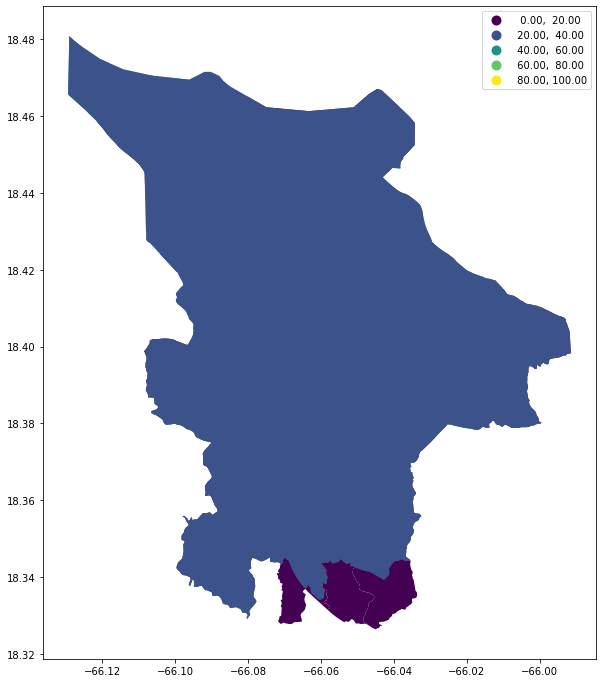

In [65]:
# equal interval
df.plot(figsize=(12,12),
                 column='Percent Households with Less than $10,000',
                 legend=True, 
                 scheme='equal_interval')

<AxesSubplot:>

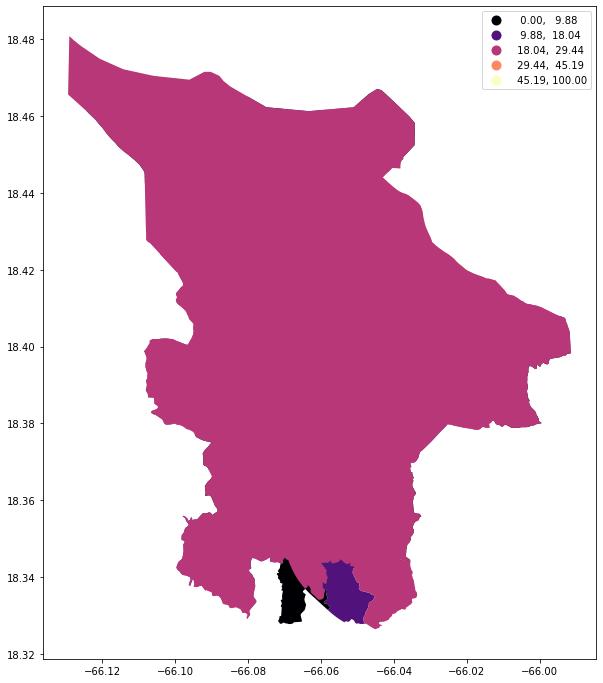

In [66]:
# quantiles with different color scheme
df.plot(figsize=(12,12),
                 column='Percent Households with Less than $10,000',
                 legend=True, 
                 scheme='quantiles',
                 cmap='magma'
        )

Text(0.5, 1.0, 'Percent Households with $200,000 Income or more')

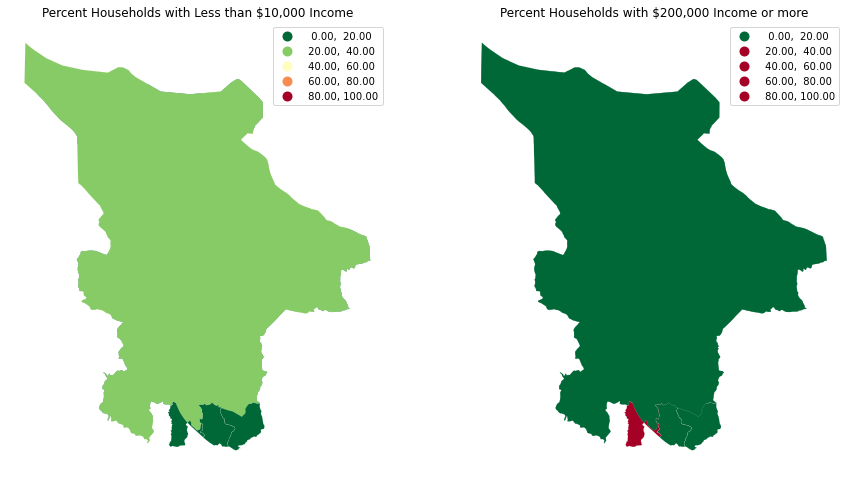

In [67]:
# create the 1x2 subplots
# set sharex and sharey to true to scale each map equally
fig, axs = plt.subplots(1, 2, figsize=(15, 12), sharex=True, sharey=True)

# name each subplot
ax1, ax2 = axs

# percent households Less than $10,000 to the left
df.plot(column='Percent Households with Less than $10,000', 
            cmap='RdYlGn_r', 
            scheme='user_defined',
            classification_kwds={'bins':[20,40,60,80,100]},
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Percent Households with Less than $10,000 Income")

# percent Percent Households with $200,000 or more
df.plot(column='Percent Households with $200,000 or more', 
            cmap='RdYlGn_r', 
            scheme='user_defined',
            classification_kwds={'bins':[20,40,60,80,100]},
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Percent Households with $200,000 Income or more")

Text(0.5, 1.0, 'Percent Households with $60,000 to $74,999')

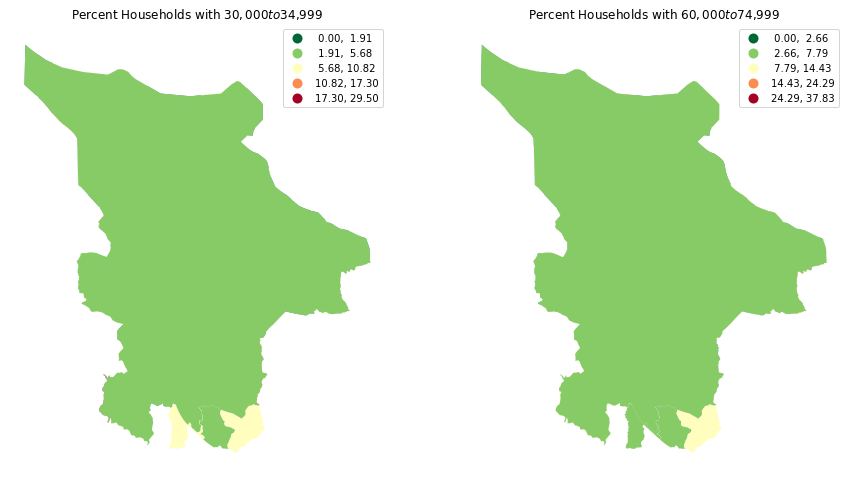

In [68]:
# create the 1x2 subplots
# set sharex and sharey to true to scale each map equally
fig, axs = plt.subplots(1, 2, figsize=(15, 12), sharex=True, sharey=True)

# name each subplot
ax1, ax2 = axs

# percent households Percent Households with $30,000 to $34,999
df.plot(column='Percent Households with $30,000 to $34,999', 
            cmap='RdYlGn_r', 
            scheme='NaturalBreaks',
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Percent Households with $30,000 to $34,999")

#  Percent Households with $60,000 to $74,999 map on the right
df.plot(column='Percent Households with $60,000 to $74,999', 
            cmap='RdYlGn_r', 
            scheme='NaturalBreaks',
            edgecolor='white', 
            linewidth=0.1, 
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Percent Households with $60,000 to $74,999")

<AxesSubplot:>

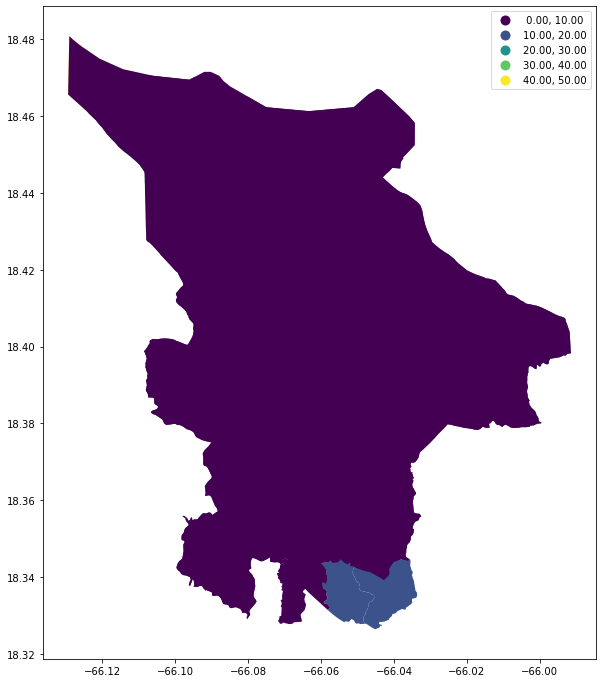

In [69]:
# equal interval
df.plot(figsize=(12,12),
                 column='Percent Households with $10,000 to $14,999',
                 legend=True, 
                 scheme='equal_interval')

I am not too satisfied with these maps, as for some reason variation keeps clustering at the bottom of San Juan. 

#### Adding basemaps

In [65]:
# reproject to Web Mercator
df_web_mercator = df.to_crs(epsg=3857)

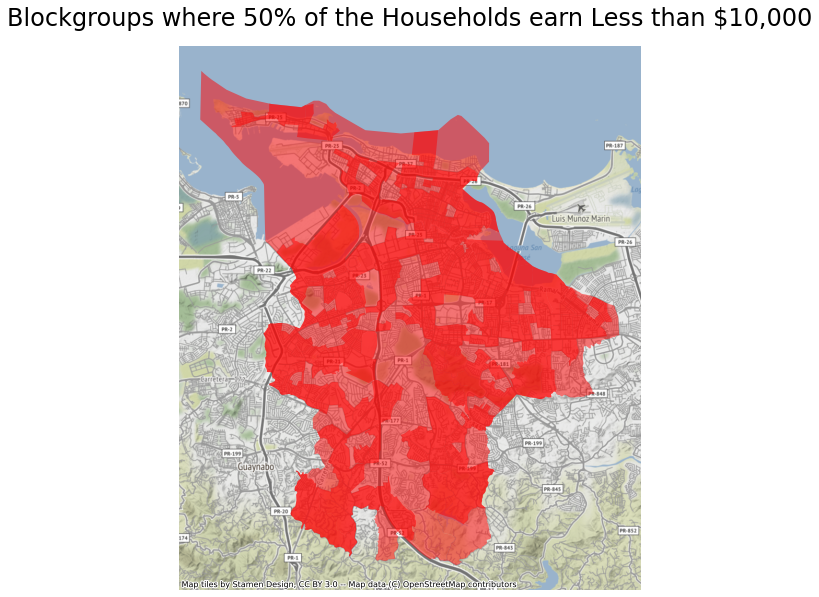

In [75]:
fig, ax = plt.subplots(figsize=(10, 10))

# add the layer with ax=ax in the argument 
df_web_mercator[df_web_mercator['Less than $10,000'] > 50].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where 50% of the Households earn Less than $10,000',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

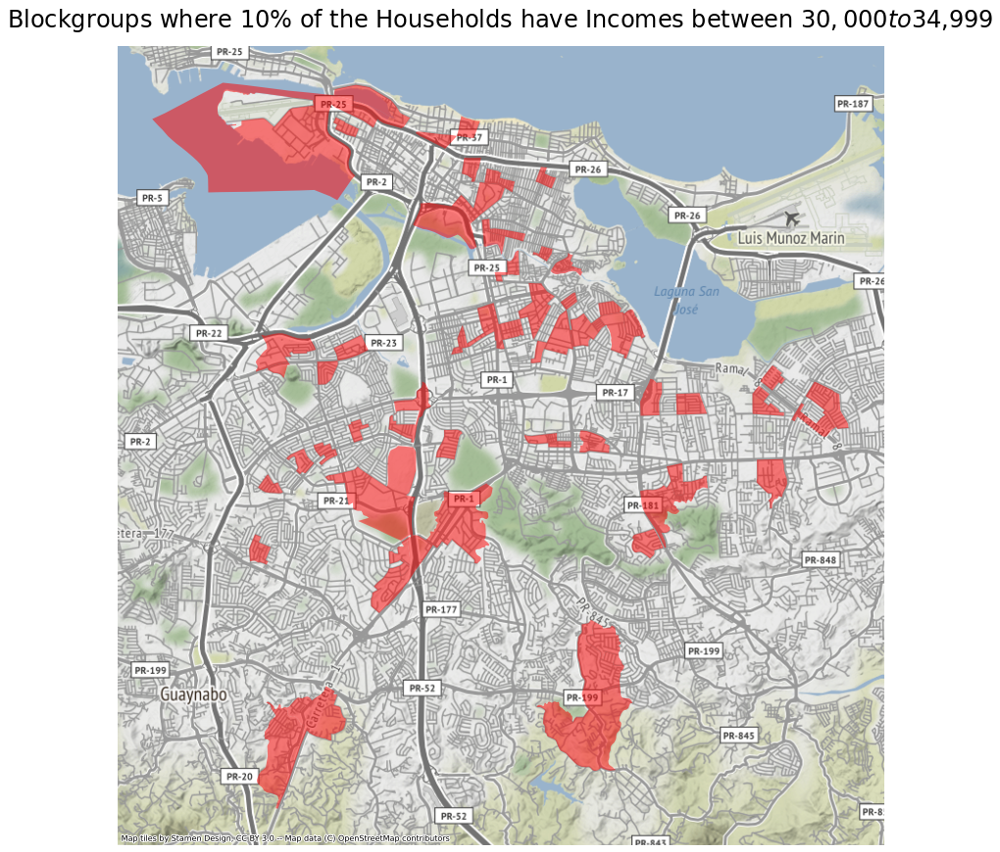

In [73]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
df_web_mercator[df_web_mercator['Percent Households with $30,000 to $34,999'] > 10].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where 10% of the Households have Incomes between $30,000 to $34,999',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

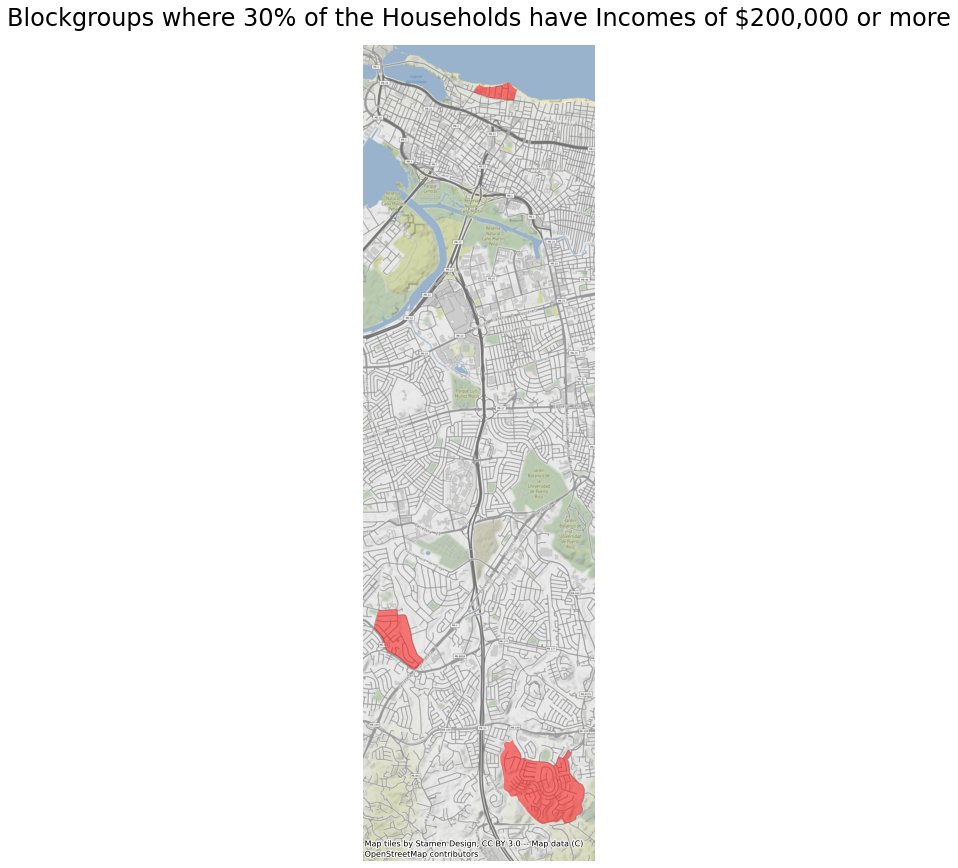

In [73]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
df_web_mercator[df_web_mercator['Percent Households with $200,000 or more'] > 30].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where 30% of the Households have Incomes of $200,000 or more',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

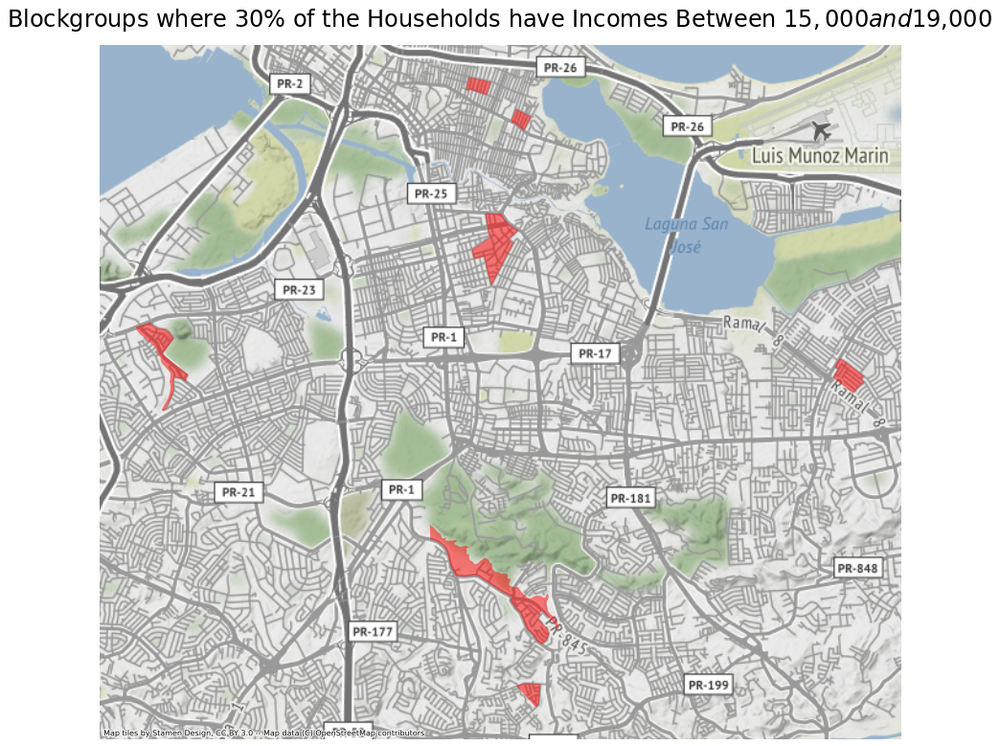

In [75]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
df_web_mercator[df_web_mercator['Percent Households with $15,000 to $19,999'] > 30].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where 30% of the Households have Incomes Between $15,000 and $19,000 ',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

#### Interactive map

What follows below is an attempt at creating some interactive charts.

In [78]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

In [81]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 364 entries, 1 to 364
Data columns (total 36 columns):
 #   Column                                         Non-Null Count  Dtype   
---  ------                                         --------------  -----   
 0   geoid                                          364 non-null    object  
 1   name                                           364 non-null    object  
 2   Total                                          364 non-null    float64 
 3   Less than $10,000                              364 non-null    float64 
 4   $10,000 to $14,999                             364 non-null    float64 
 5   $15,000 to $19,999                             364 non-null    float64 
 6   $20,000 to $24,999                             364 non-null    float64 
 7   $25,000 to $29,999                             364 non-null    float64 
 8   $30,000 to $34,999                             364 non-null    float64 
 9   $35,000 to $39,999                 

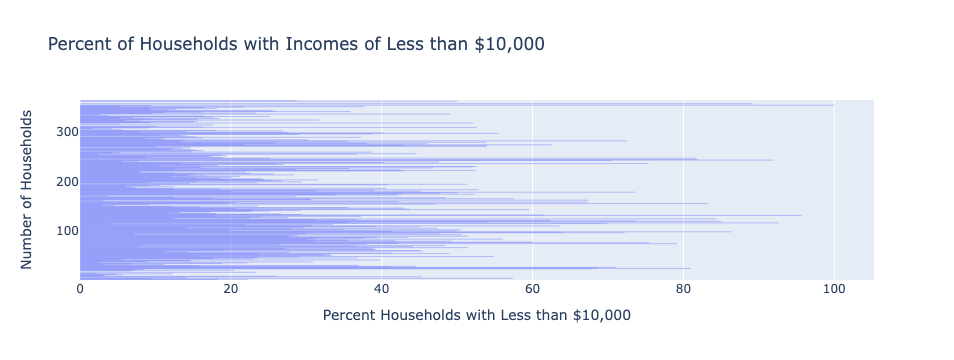

In [101]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(df,
       x='Percent Households with Less than $10,000',
       title='Percent of Households with Incomes of Less than $10,000 ', labels= {'Percent Households with Less than $10,000':'Percent Households with Less than $10,000',
            'index':'Number of Households'}
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

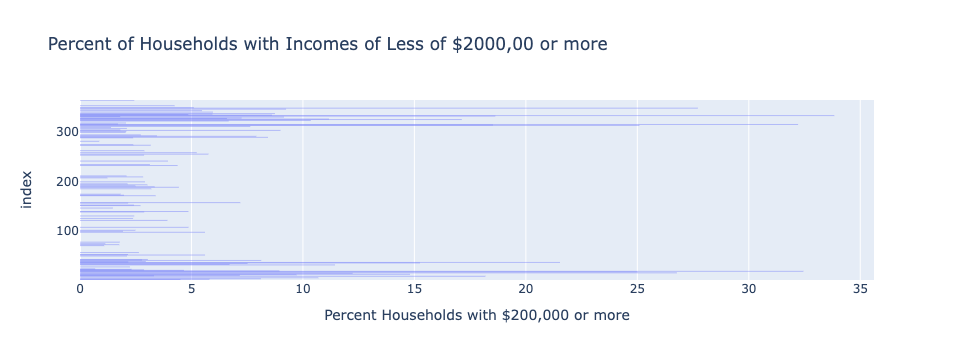

In [92]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(df,
       x='Percent Households with $200,000 or more',
       title='Percent of Households with Incomes of Less of $2000,00 or more'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

In [106]:
# subset the data below (don't forget to add .copy at the end)
df_mini = df[['Percent Households with Less than $10,000','Percent Households with $20,000 to $24,999','$30,000 to $34,999','Percent Households with $40,000 to $44,999','Percent Households with $50,000 to $59,999','Percent Households with $75,000 to $99,999', 'Percent Houselholds with $125,000 to $149,999','Percent Households with $200,000 or more','geometry']].copy()

In [107]:
# get info for our subset data
df_mini.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 364 entries, 1 to 364
Data columns (total 9 columns):
 #   Column                                         Non-Null Count  Dtype   
---  ------                                         --------------  -----   
 0   Percent Households with Less than $10,000      355 non-null    float64 
 1   Percent Households with $20,000 to $24,999     355 non-null    float64 
 2   $30,000 to $34,999                             364 non-null    float64 
 3   Percent Households with $40,000 to $44,999     355 non-null    float64 
 4   Percent Households with $50,000 to $59,999     355 non-null    float64 
 5   Percent Households with $75,000 to $99,999     355 non-null    float64 
 6   Percent Houselholds with $125,000 to $149,999  355 non-null    float64 
 7   Percent Households with $200,000 or more       355 non-null    float64 
 8   geometry                                       364 non-null    geometry
dtypes: float64(8), geometry(1)
memory us

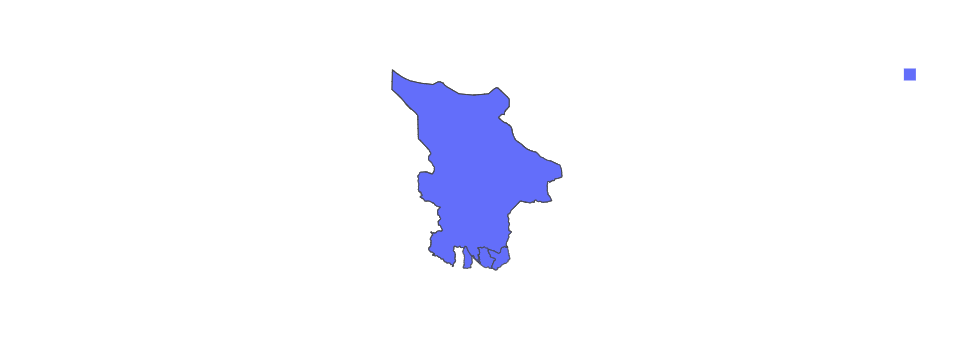

In [226]:
# plotting it

import plotly.express as px

fig = px.choropleth(df_mini,
                   geojson=df_mini.geometry,
                   locations=df_mini.index,
                   projection="mercator")
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

What I was trying to do above was create an interactive map, but my data is in geojson and it doesn't have lat and long. Yoh posted a solution for Micah on Slack, but this depends on the  geojson having a point layer. I tried implementing Yoh's suggestion, but I am running into a Syntax Error still. I'm going to move on at this point and consult this later.

Okay, after Ryan posted a solution on Slack, I was able to create it! I'm sure it has some issues, but since I've already started other things here, I'll finish what I have and start working on this a bit later on next's iteration.

#### Attempting to Open the Puerto Rican Gov Data on Hotels and Tourism
This data came as a shapefile, so I am going to convert it to geojson.

In [123]:
import geopandas

myshpfile = geopandas.read_file('g07_turismo_paradores_hoteles.shp')
myshpfile.to_file('myJson.geojson', driver='GeoJSON')

In [125]:
#It uploaded!! Now let's examine it
myshpfile.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 201 entries, 0 to 200
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   height      201 non-null    float64 
 1   id          201 non-null    int64   
 2   northing    201 non-null    float64 
 3   easting     201 non-null    float64 
 4   nombre_     200 non-null    object  
 5   z_de_habit  83 non-null     object  
 6   direccion   194 non-null    object  
 7   pueblo      200 non-null    object  
 8   zip_code    201 non-null    float64 
 9   telefono    201 non-null    float64 
 10  telefono_1  200 non-null    object  
 11  fax         200 non-null    object  
 12  e_mail      200 non-null    object  
 13  endosado    200 non-null    object  
 14  zip_code_1  196 non-null    object  
 15  globalid    201 non-null    object  
 16  shape_leng  201 non-null    float64 
 17  shape_area  201 non-null    float64 
 18  geometry    201 non-null    geometry
dtype

In [128]:
myshpfile.shape

(201, 19)

In [129]:
myshpfile.head()

,height,id,northing,easting,nombre_,z_de_habit,direccion,pueblo,zip_code,telefono,telefono_1,fax,e_mail,endosado,zip_code_1,globalid,shape_leng,shape_area,geometry
0,3.1,218,18.1555,-65.4416,Bravo Beach Hotel/Ocean Side Boutique Hotel,None,Carr North Shore,Vieques,765.0,7.877411e+09,787-741-1128,N/A,info@bravobeachhotel.com,No,00765,{A843510D-7B39-4512-BE0B-8F047F32F830},240.883431,881.170153,"POLYGON ((304865.131 235969.574, 304866.644 23..."
1,9.5,227,18.1508,-65.4430,Ocean View Hotel,35,None,Vieques,765.0,7.877414e+09,787-741-3696,N/A,N/A,No,00765,{579445EA-C51E-4431-9578-9ED0363D7962},109.244989,661.252246,"POLYGON ((304794.062 235421.907, 304795.827 23..."
2,7.5,212,18.1417,-65.4713,Wyndham Martineau Bay Resort & Spa,None,Carr 200 Km 3.4,Vieques,765.0,7.877414e+09,787-741-4100,787-741-4171,blutt@wyndham.com,Si,00765,{9B927883-BD4A-4750-A156-8694403985F2},266.044377,1743.682689,"POLYGON ((301777.397 234436.356, 301754.153 23..."
3,7.2,213,18.1310,-65.4621,Crow's Nest Inn,14,Carr 201 Km 1.1,Vieques,765.0,8.772770e+09,787-741-0033,787-741-1294,crowsnestvieques@yahoo.com,Si,00765,{CB7B6010-B431-4FE7-9880-98014D8AEC1C},82.405547,302.402339,"POLYGON ((302691.063 233239.747, 302687.175 23..."
4,5.3,228,18.1021,-65.4707,Casa del Francés,18,None,Vieques,765.0,7.877414e+09,787-741-3751,N/A,N/A,No,00765,{7EAA1B3E-7F49-4508-9654-9C68D57D2FA7},110.620268,747.858968,"POLYGON ((301886.997 230028.799, 301860.372 23..."


In [131]:
#data types
myshpfile.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 201 entries, 0 to 200
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   height      201 non-null    float64 
 1   id          201 non-null    int64   
 2   northing    201 non-null    float64 
 3   easting     201 non-null    float64 
 4   nombre_     200 non-null    object  
 5   z_de_habit  83 non-null     object  
 6   direccion   194 non-null    object  
 7   pueblo      200 non-null    object  
 8   zip_code    201 non-null    float64 
 9   telefono    201 non-null    float64 
 10  telefono_1  200 non-null    object  
 11  fax         200 non-null    object  
 12  e_mail      200 non-null    object  
 13  endosado    200 non-null    object  
 14  zip_code_1  196 non-null    object  
 15  globalid    201 non-null    object  
 16  shape_leng  201 non-null    float64 
 17  shape_area  201 non-null    float64 
 18  geometry    201 non-null    geometry
dtype

/tmp/ipykernel_55/303343155.py:2: FutureWarning:

null_counts is deprecated. Use show_counts instead



In [133]:
myshpfile.sample()

,height,id,northing,easting,nombre_,z_de_habit,direccion,pueblo,zip_code,telefono,telefono_1,fax,e_mail,endosado,zip_code_1,globalid,shape_leng,shape_area,geometry
126,7.6,2,18.2074,-66.7275,Parador Villas Sotomayor,None,Carr 123 Intersecci¢n 522 Km 36.6 Bo Garzas,Adjuntas,601.0,7.878292e+09,787-829-1717,787-829-5105,vsoto@villassotomayor.com,Si,00601,{726AD748-C02C-4F92-B700-EA6E8DF65677},117.10551,531.166924,"POLYGON ((167780.422 237540.047, 167772.083 23..."


<AxesSubplot:>

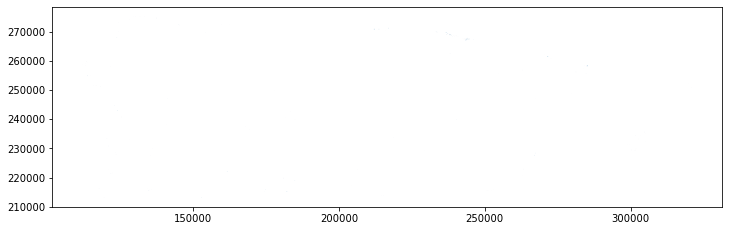

In [134]:
myshpfile.plot(figsize=(12,12))

I'm guessing it's not plotting because of null values?

In [136]:
list(myshpfile)

['height',
 'id',
 'northing',
 'easting',
 'nombre_',
 'z_de_habit',
 'direccion',
 'pueblo',
 'zip_code',
 'telefono',
 'telefono_1',
 'fax',
 'e_mail',
 'endosado',
 'zip_code_1',
 'globalid',
 'shape_leng',
 'shape_area',
 'geometry']

<AxesSubplot:ylabel='Frequency'>

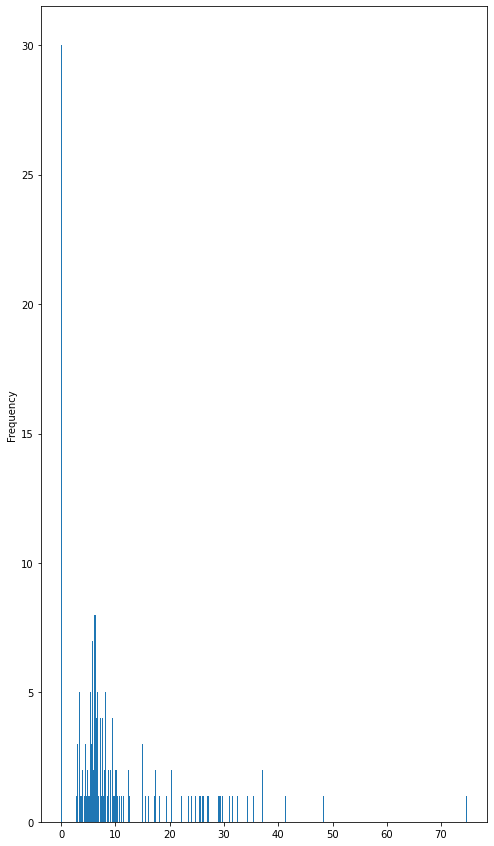

In [142]:
#histogram with 50 bins
myshpfile['height'].plot.hist(figsize=(8,15),bins=500)

<AxesSubplot:>

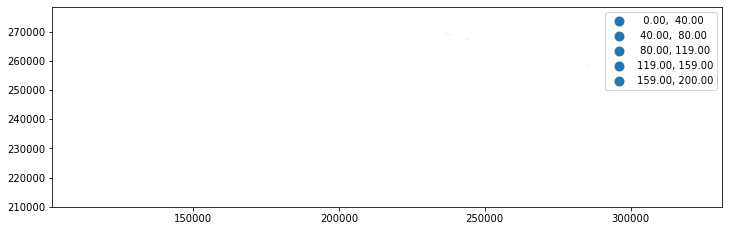

In [145]:
# natural breaks
myshpfile.plot(figsize=(12,12),
                 column='globalid',
                 legend=True, 
                 scheme='NaturalBreaks')

I'm thinking I might need to bring a map here? Let's see

In [146]:
# read in a geojson file downloaded from github
tracts=gpd.read_file('https://raw.githubusercontent.com/commonwealth-of-puerto-rico/crime-spotter/master/public/data/municipalities.geojson')
tracts.head()

,STATE,COUNTY,NAME,geometry
0,72,071,Isabela,"POLYGON ((-67.10328 18.51343, -67.10339 18.514..."
1,72,005,Aguadilla,"POLYGON ((-67.10328 18.51343, -67.10281 18.512..."
2,72,013,Arecibo,"POLYGON ((-66.58678 18.48495, -66.58683 18.484..."
3,72,065,Hatillo,"POLYGON ((-66.76483 18.48407, -66.76598 18.481..."
4,72,115,Quebradillas,"POLYGON ((-66.90143 18.48455, -66.90138 18.483..."


<AxesSubplot:>

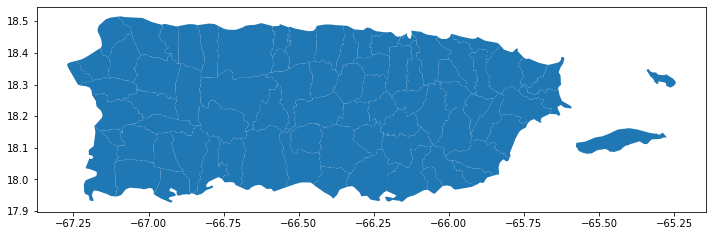

In [149]:
tracts.plot(figsize=(12,12))

Okay, I'm hitting a wall here. For time's sake, I am going to overlap another set from census data and revisit what I can do with this gov data in office hours.

#### Adding Another Data Source to Create Map with Overlay

By now, I have seen the average income in San Juan. Now, I want to see how that is divided by ethnicity. While in my proposal I've spoken about race not being a good indicator of gentrification in Puerto Rico because of how problematic the concept is, I believe showing ethnicity (non-Hispanic vs. Hispanic) will be beneficial. Puerto Ricans, with very little variation, identify as Hispanics. Migration to Puerto Rico from non-Hispanics (US Whites and Blacks) might be visible here, thus a sign of gentrification.   

ps: this is also for 2019 (5-year ACS), for blockgroups in San Juan too.

In [151]:
#loading my data
gdf = gpd.read_file('acs2019_san juan_race.geojson')

In [152]:
#examining data
gdf.shape

(365, 45)

In [153]:
gdf.head()

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
0,15000US721270004001,"Block Group 1, San Juan, PR",902.0,256.0,0.0,14.0,0.0,14.0,0.0,14.0,...,14.0,140.0,78.0,106.0,98.0,0.0,14.0,106.0,98.0,"MULTIPOLYGON (((-66.11862 18.46914, -66.11834 ..."
1,15000US721270004002,"Block Group 2, San Juan, PR",647.0,178.0,66.0,63.0,22.0,24.0,37.0,58.0,...,14.0,6.0,10.0,55.0,75.0,0.0,14.0,55.0,75.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",589.0,156.0,104.0,72.0,104.0,72.0,0.0,14.0,...,14.0,34.0,37.0,40.0,39.0,10.0,14.0,30.0,39.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",926.0,243.0,61.0,81.0,61.0,81.0,0.0,14.0,...,14.0,31.0,34.0,147.0,147.0,11.0,16.0,136.0,147.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",630.0,173.0,0.0,14.0,0.0,14.0,0.0,14.0,...,14.0,59.0,86.0,84.0,74.0,0.0,14.0,84.0,74.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."


<AxesSubplot:>

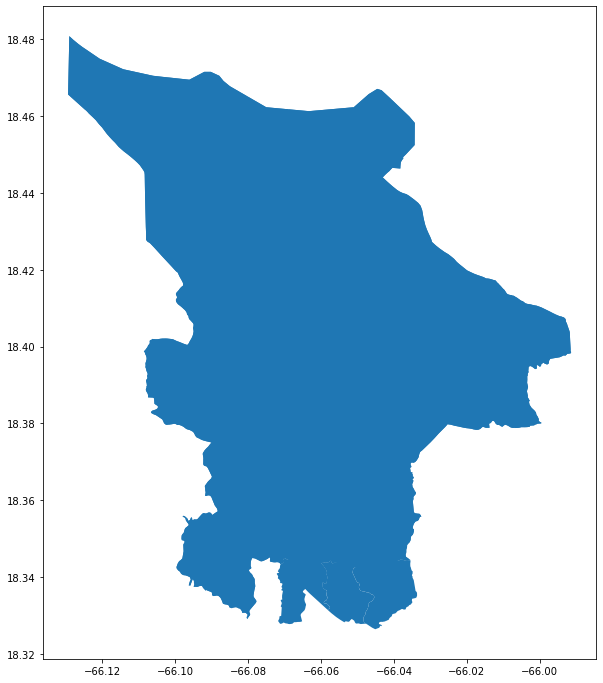

In [154]:
#Okay, I'm going to plot it now
gdf.plot(figsize=(12,12))

In [155]:
#data types
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 45 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             365 non-null    object  
 1   name              365 non-null    object  
 2   B03002001         365 non-null    float64 
 3   B03002001, Error  365 non-null    float64 
 4   B03002002         365 non-null    float64 
 5   B03002002, Error  365 non-null    float64 
 6   B03002003         365 non-null    float64 
 7   B03002003, Error  365 non-null    float64 
 8   B03002004         365 non-null    float64 
 9   B03002004, Error  365 non-null    float64 
 10  B03002005         365 non-null    float64 
 11  B03002005, Error  365 non-null    float64 
 12  B03002006         365 non-null    float64 
 13  B03002006, Error  365 non-null    float64 
 14  B03002007         365 non-null    float64 
 15  B03002007, Error  365 non-null    float64 
 16  B03002008         

In [156]:
gdf.geoid.head()

0    15000US721270004001
1    15000US721270004002
2    15000US721270005061
3    15000US721270005062
4    15000US721270006001
Name: geoid, dtype: object

In [157]:
# drop the row with index 0 (i.e. the first row)
gdf = gdf.drop([0])

In [159]:
gdf.head()

,geoid,name,B03002001,"B03002001, Error",B03002002,"B03002002, Error",B03002003,"B03002003, Error",B03002004,"B03002004, Error",...,"B03002017, Error",B03002018,"B03002018, Error",B03002019,"B03002019, Error",B03002020,"B03002020, Error",B03002021,"B03002021, Error",geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",647.0,178.0,66.0,63.0,22.0,24.0,37.0,58.0,...,14.0,6.0,10.0,55.0,75.0,0.0,14.0,55.0,75.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",589.0,156.0,104.0,72.0,104.0,72.0,0.0,14.0,...,14.0,34.0,37.0,40.0,39.0,10.0,14.0,30.0,39.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",926.0,243.0,61.0,81.0,61.0,81.0,0.0,14.0,...,14.0,31.0,34.0,147.0,147.0,11.0,16.0,136.0,147.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",630.0,173.0,0.0,14.0,0.0,14.0,0.0,14.0,...,14.0,59.0,86.0,84.0,74.0,0.0,14.0,84.0,74.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",647.0,168.0,52.0,38.0,39.0,32.0,13.0,19.0,...,14.0,25.0,30.0,89.0,119.0,0.0,14.0,89.0,119.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [160]:
# check to see if it has been deleted
list(gdf)

['geoid',
 'name',
 'B03002001',
 'B03002001, Error',
 'B03002002',
 'B03002002, Error',
 'B03002003',
 'B03002003, Error',
 'B03002004',
 'B03002004, Error',
 'B03002005',
 'B03002005, Error',
 'B03002006',
 'B03002006, Error',
 'B03002007',
 'B03002007, Error',
 'B03002008',
 'B03002008, Error',
 'B03002009',
 'B03002009, Error',
 'B03002010',
 'B03002010, Error',
 'B03002011',
 'B03002011, Error',
 'B03002012',
 'B03002012, Error',
 'B03002013',
 'B03002013, Error',
 'B03002014',
 'B03002014, Error',
 'B03002015',
 'B03002015, Error',
 'B03002016',
 'B03002016, Error',
 'B03002017',
 'B03002017, Error',
 'B03002018',
 'B03002018, Error',
 'B03002019',
 'B03002019, Error',
 'B03002020',
 'B03002020, Error',
 'B03002021',
 'B03002021, Error',
 'geometry']

In [161]:
columns_to_keep = ['geoid',
 'name',
 'B03002001',
 'B03002002',
 'B03002003',
 'B03002004',
 'B03002005',
 'B03002006',
 'B03002007',
 'B03002008',
 'B03002009',
 'B03002010',
 'B03002011',
 'B03002012',
 'B03002013',
 'B03002014',
 'B03002015',
 'B03002016',
 'B03002017',
 'B03002018',
 'B03002019',
 'B03002020',
 'B03002021',
 'geometry']

In [162]:
# redefine gdf with only columns to keep
gdf = gdf[columns_to_keep]

In [163]:
gdf.head()

,geoid,name,B03002001,B03002002,B03002003,B03002004,B03002005,B03002006,B03002007,B03002008,...,B03002013,B03002014,B03002015,B03002016,B03002017,B03002018,B03002019,B03002020,B03002021,geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",647.0,66.0,22.0,37.0,0.0,0.0,0.0,0.0,...,490.0,30.0,0.0,0.0,0.0,6.0,55.0,0.0,55.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",589.0,104.0,104.0,0.0,0.0,0.0,0.0,0.0,...,411.0,0.0,0.0,0.0,0.0,34.0,40.0,10.0,30.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",926.0,61.0,61.0,0.0,0.0,0.0,0.0,0.0,...,565.0,122.0,0.0,0.0,0.0,31.0,147.0,11.0,136.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",630.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,410.0,77.0,0.0,0.0,0.0,59.0,84.0,0.0,84.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",647.0,52.0,39.0,13.0,0.0,0.0,0.0,0.0,...,408.0,73.0,0.0,0.0,0.0,25.0,89.0,0.0,89.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [167]:
#rename
gdf.columns = ['geoid',
'name',
'Total',
'Not Hispanic or Latino',
'White alone',
'Black or African American alone',
'American Indian and Alaska Native alone',
'Asian alone',
'Native Hawaiian and Other Pacific Islander alone',
'Some other race alone',
'Two or more races',
'Two races including Some other race',
'Two races excluding Some other race, and three or more races',
'Hispanic or Latino',
'White alone',
'Black or African American alone',
'American Indian and Alaska Native alone',
'Asian alone',
'Native Hawaiian and Other Pacific Islander alone',
'Some other race alone',
'Two or more races',
'Two races including Some other race',
'Two races excluding Some other race, and three or more races',
'geometry']

In [168]:
gdf.columns

Index(['geoid', 'name', 'Total', 'Not Hispanic or Latino', 'White alone',
       'Black or African American alone',
       'American Indian and Alaska Native alone', 'Asian alone',
       'Native Hawaiian and Other Pacific Islander alone',
       'Some other race alone', 'Two or more races',
       'Two races including Some other race',
       'Two races excluding Some other race, and three or more races',
       'Hispanic or Latino', 'White alone', 'Black or African American alone',
       'American Indian and Alaska Native alone', 'Asian alone',
       'Native Hawaiian and Other Pacific Islander alone',
       'Some other race alone', 'Two or more races',
       'Two races including Some other race',
       'Two races excluding Some other race, and three or more races',
       'geometry'],
      dtype='object')

In [169]:
gdf.head()

,geoid,name,Total,Not Hispanic or Latino,White alone,Black or African American alone,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some other race alone,...,White alone,Black or African American alone,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some other race alone,Two or more races,Two races including Some other race,"Two races excluding Some other race, and three or more races",geometry
1,15000US721270004002,"Block Group 2, San Juan, PR",647.0,66.0,22.0,37.0,0.0,0.0,0.0,0.0,...,490.0,30.0,0.0,0.0,0.0,6.0,55.0,0.0,55.0,"MULTIPOLYGON (((-66.11601 18.46817, -66.11569 ..."
2,15000US721270005061,"Block Group 1, San Juan, PR",589.0,104.0,104.0,0.0,0.0,0.0,0.0,0.0,...,411.0,0.0,0.0,0.0,0.0,34.0,40.0,10.0,30.0,"MULTIPOLYGON (((-66.11925 18.46353, -66.11908 ..."
3,15000US721270005062,"Block Group 2, San Juan, PR",926.0,61.0,61.0,0.0,0.0,0.0,0.0,0.0,...,565.0,122.0,0.0,0.0,0.0,31.0,147.0,11.0,136.0,"MULTIPOLYGON (((-66.12455 18.46155, -66.12021 ..."
4,15000US721270006001,"Block Group 1, San Juan, PR",630.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,410.0,77.0,0.0,0.0,0.0,59.0,84.0,0.0,84.0,"MULTIPOLYGON (((-66.10417 18.46589, -66.10386 ..."
5,15000US721270006002,"Block Group 2, San Juan, PR",647.0,52.0,39.0,13.0,0.0,0.0,0.0,0.0,...,408.0,73.0,0.0,0.0,0.0,25.0,89.0,0.0,89.0,"MULTIPOLYGON (((-66.12381 18.46080, -66.12087 ..."


In [170]:
# get a random record
random_blockgroup = gdf.sample()
random_blockgroup

,geoid,name,Total,Not Hispanic or Latino,White alone,Black or African American alone,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some other race alone,...,White alone,Black or African American alone,American Indian and Alaska Native alone,Asian alone,Native Hawaiian and Other Pacific Islander alone,Some other race alone,Two or more races,Two races including Some other race,"Two races excluding Some other race, and three or more races",geometry
69,15000US721270032001,"Block Group 1, San Juan, PR",885.0,10.0,0.0,0.0,0.0,0.0,0.0,10.0,...,209.0,81.0,15.0,0.0,0.0,570.0,0.0,0.0,0.0,"MULTIPOLYGON (((-66.05278 18.43692, -66.05261 ..."


<AxesSubplot:>

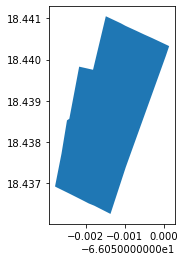

In [171]:
random_blockgroup.plot()

In [172]:
# get some stats
gdf['Total'].describe()

count       364.000000
mean       1781.288462
std       16905.991415
min           0.000000
25%         579.000000
50%         781.500000
75%        1090.250000
max      323279.000000
Name: Total, dtype: float64

<AxesSubplot:ylabel='Frequency'>

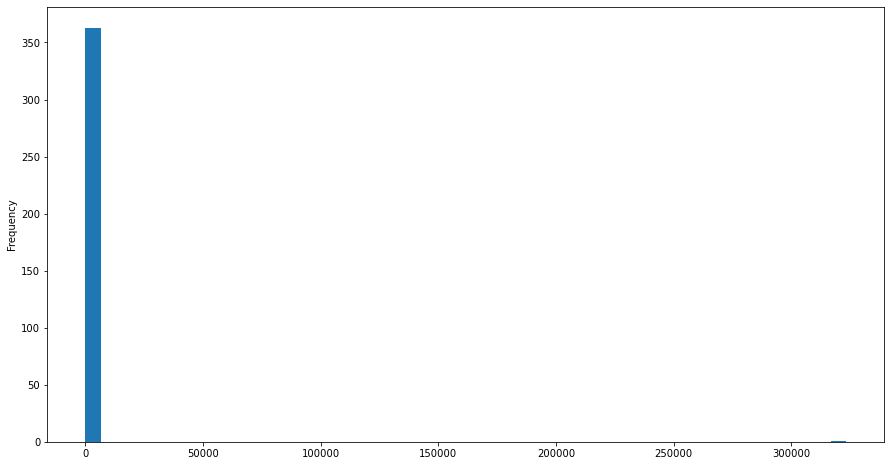

In [174]:
# plot it as a historgram with 500 bins
gdf['Total'].plot.hist(figsize=(15,8),bins=50)

In [175]:
gdf_sorted = gdf.sort_values(by='Total',ascending = False)

<AxesSubplot:>

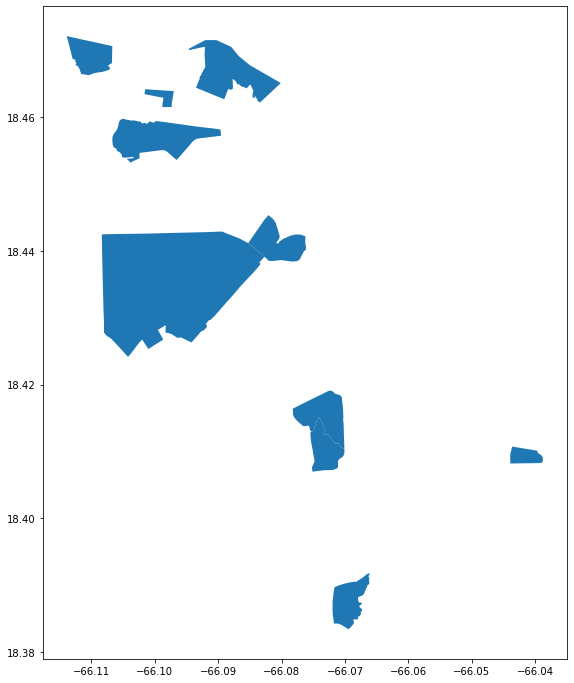

In [176]:
# plot it
gdf_sorted.tail(10).plot(figsize=(12,12))

<AxesSubplot:>

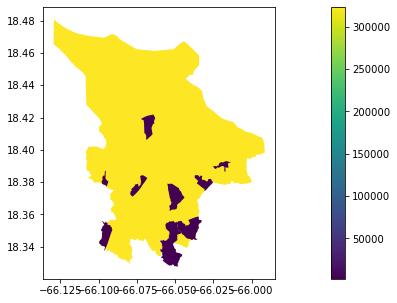

In [177]:
# Make it prettier
gdf_sorted.head(10).plot(figsize=(20,5),
                          column='Total',
                          legend=True)

<AxesSubplot:>

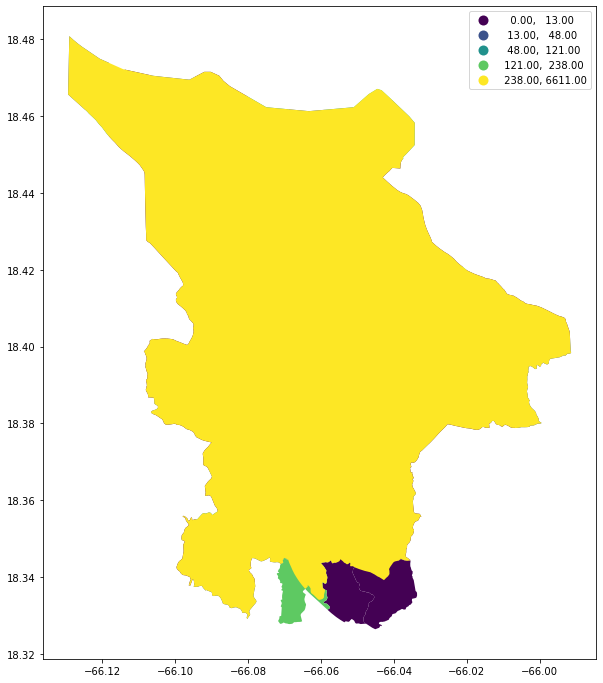

In [178]:
# natural breaks
gdf.plot(figsize=(12,12),
                 column='Not Hispanic or Latino',
                 legend=True, 
                 scheme='NaturalBreaks')

<AxesSubplot:>

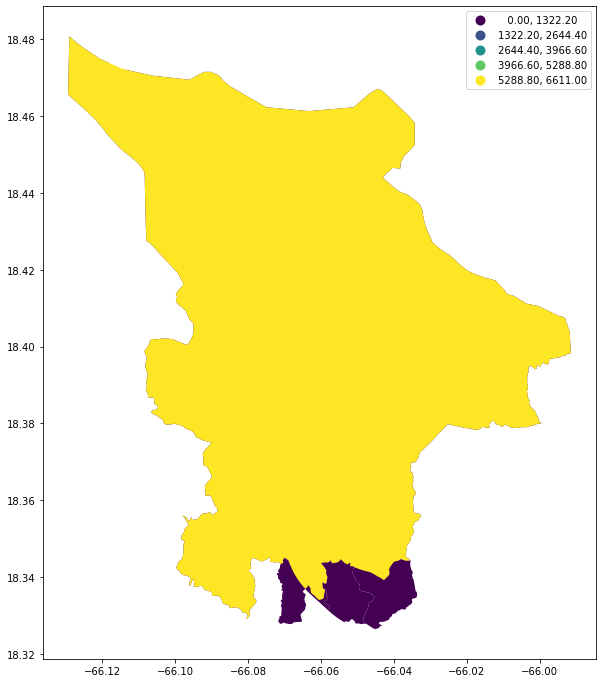

In [179]:
# equal interval
gdf.plot(figsize=(12,12),
                 column='Not Hispanic or Latino',
                 legend=True, 
                 scheme='equal_interval')

<AxesSubplot:>

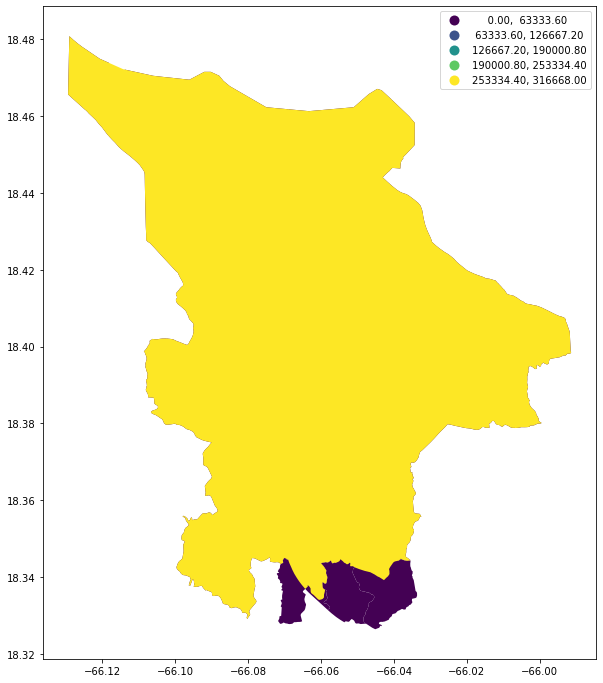

In [180]:
# equal interval
gdf.plot(figsize=(12,12),
                 column='Hispanic or Latino',
                 legend=True, 
                 scheme='equal_interval')

As before, this gets weird when my data is not normalized, so let me do that.

In [181]:
gdf.columns

Index(['geoid', 'name', 'Total', 'Not Hispanic or Latino', 'White alone',
       'Black or African American alone',
       'American Indian and Alaska Native alone', 'Asian alone',
       'Native Hawaiian and Other Pacific Islander alone',
       'Some other race alone', 'Two or more races',
       'Two races including Some other race',
       'Two races excluding Some other race, and three or more races',
       'Hispanic or Latino', 'White alone', 'Black or African American alone',
       'American Indian and Alaska Native alone', 'Asian alone',
       'Native Hawaiian and Other Pacific Islander alone',
       'Some other race alone', 'Two or more races',
       'Two races including Some other race',
       'Two races excluding Some other race, and three or more races',
       'geometry'],
      dtype='object')

In [190]:
#creating columns with normalized data
gdf['Percentage of Not Hispanic or Latino']=gdf['Not Hispanic or Latino']/gdf['Total']*100

In [192]:
gdf['Percentage of Black or African American alone']=gdf['Black or African American alone']/gdf['Total']*100
gdf['Percentage of American Indian and Alaska Native alone']=gdf['American Indian and Alaska Native alone']/df['Total']*100
gdf['Percentage of Asian alone']=gdf['American Indian and Alaska Native alone']/df['Total']*100
gdf['Percentage of Native Hawaiian and Other Pacific Islander alone']=/df['Total']*100
gdf['Percentage of Some other race alone']/df['Total']*100
gdf['Percentage of Two or more races']/df['Total']*100
gdf['Percentage of Two races including Some other race']/df['Total']*100
gdf['Percentage of Hispanic or Latino']/df['Total']*100
gdf['Percentage of White alone']/df['Total']*100
gdf['Percentage of Black or African American alone']/df['Total']*100
gdf['Percentage of American Indian and Alaska Native alone']/df['Total']*100
gdf['Percentage of Asian alone']/df['Total']*100
gdf['Percentage of Native Hawaiian and Other Pacific Islander alone']/df['Total']*100
gdf['Percentage of Some other race alone']/df['Total']*100
gdf['Percentage of Two or more races']/df['Total']*100
gdf['Percentage of Two races including Some other race']/df['Total']*100
gdf['Percentage of Two races excluding Some other race, and three or more races']/df['Total']*100

SyntaxError: invalid syntax (3772758441.py, line 4)

Okay, I am not sure what is wrong here, but I'm just going to convert percentage of Hispanics as it's what interests me.

In [193]:
gdf['Percentage of Hispanic or Latino']=gdf['Hispanic or Latino']/gdf['Total']*100

In [194]:
gdf.columns

Index(['geoid', 'name', 'Total', 'Not Hispanic or Latino', 'White alone',
       'Black or African American alone',
       'American Indian and Alaska Native alone', 'Asian alone',
       'Native Hawaiian and Other Pacific Islander alone',
       'Some other race alone', 'Two or more races',
       'Two races including Some other race',
       'Two races excluding Some other race, and three or more races',
       'Hispanic or Latino', 'White alone', 'Black or African American alone',
       'American Indian and Alaska Native alone', 'Asian alone',
       'Native Hawaiian and Other Pacific Islander alone',
       'Some other race alone', 'Two or more races',
       'Two races including Some other race',
       'Two races excluding Some other race, and three or more races',
       'geometry', 'Percentage of Not Hispanic or Latino',
       'Percentage of Hispanic or Latino'],
      dtype='object')

<AxesSubplot:ylabel='Frequency'>

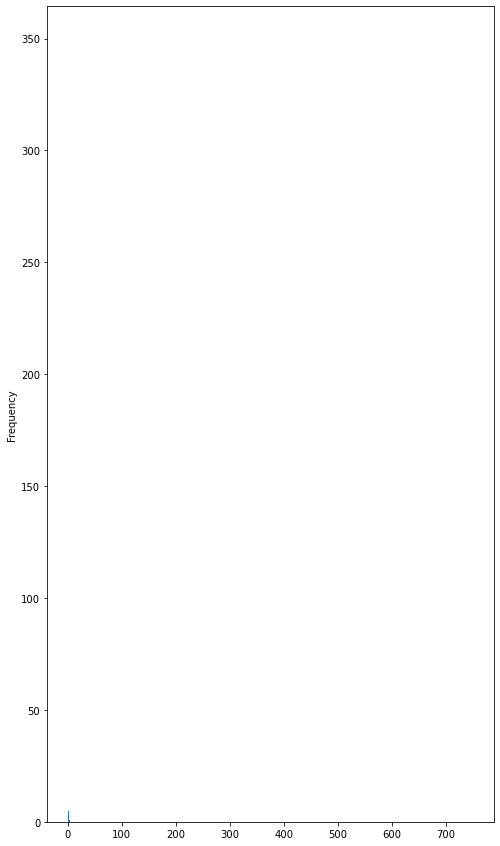

In [196]:
#histogram with 50 bins
gdf['Percentage of Not Hispanic or Latino'].plot.hist(figsize=(8,15),bins=500)

<AxesSubplot:>

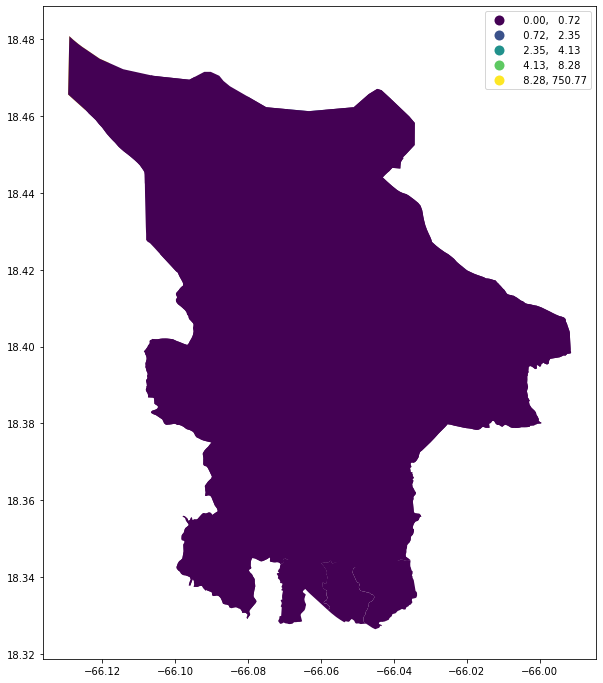

In [198]:
# natural breaks
gdf.plot(figsize=(12,12),
                 column='Percentage of Not Hispanic or Latino',
                 legend=True, 
                 scheme='NaturalBreaks')

In [202]:
# reproject to Web Mercator
gdf_web_mercator = gdf.to_crs(epsg=3857)

In [209]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
gdf_web_mercator[gdf_web_mercator['Percentage of Not Hispanic or Latino'].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where 10% of Non Hispanic and Latinos Live',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

SyntaxError: invalid syntax (2714228581.py, line 11)

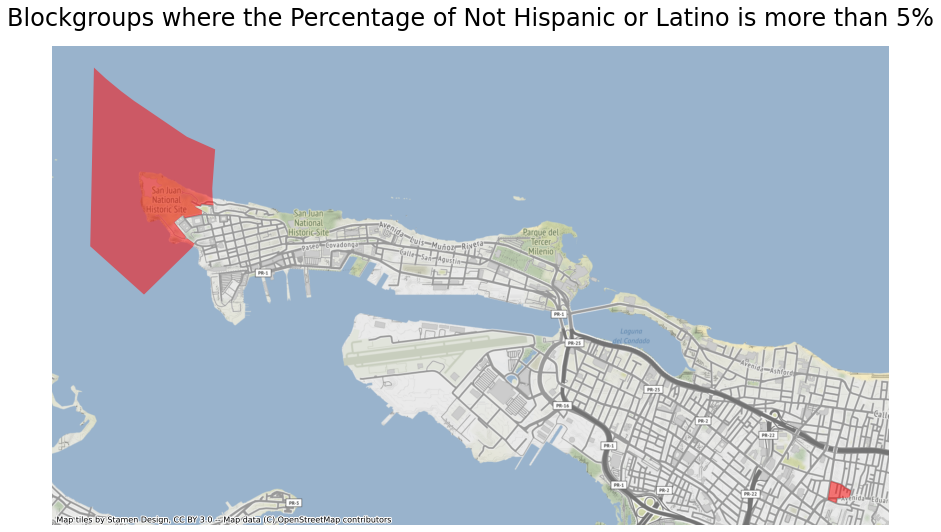

In [211]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
gdf_web_mercator[gdf_web_mercator['Percentage of Not Hispanic or Latino'] > 5].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where the Percentage of Not Hispanic or Latino is more than 5%',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

That is Old San Juan! The most historically important tourist area!

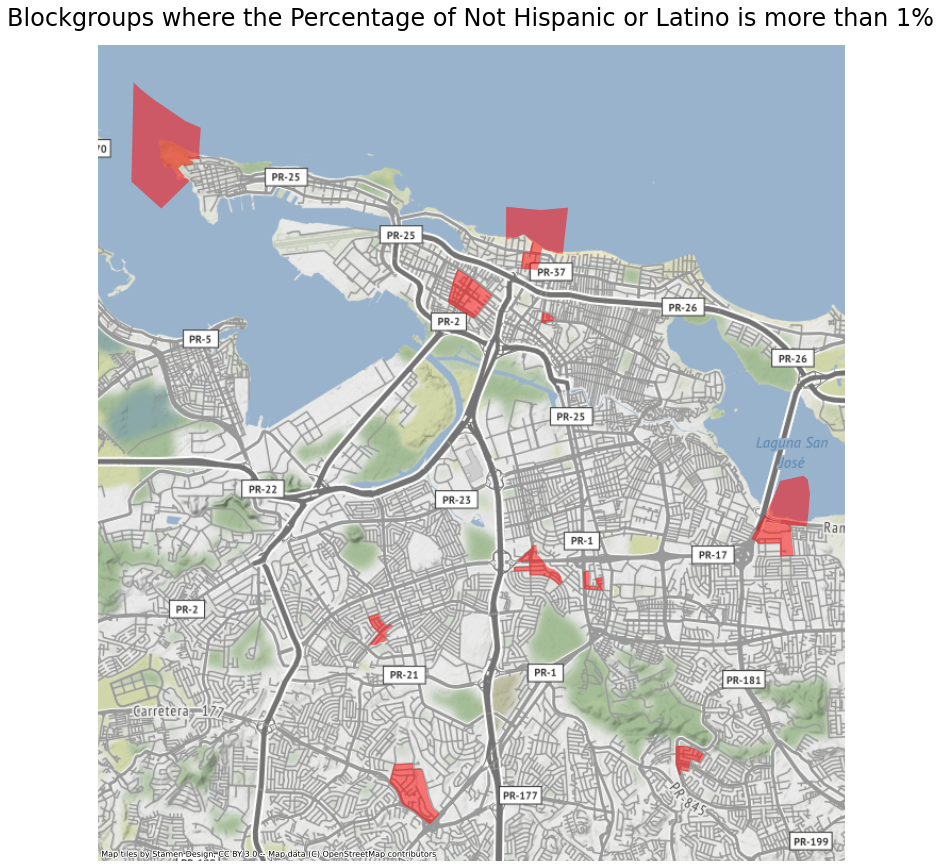

In [213]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
gdf_web_mercator[gdf_web_mercator['Percentage of Not Hispanic or Latino'] > 1].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where the Percentage of Not Hispanic or Latino is more than 1%',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

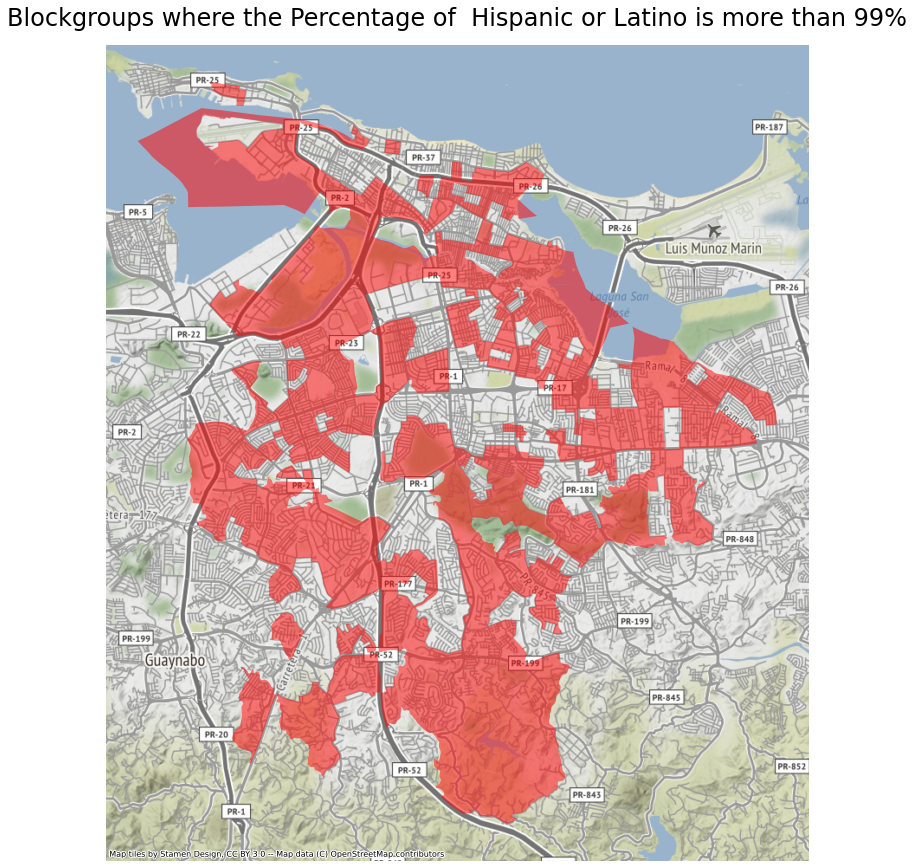

In [219]:
fig, ax = plt.subplots(figsize=(15, 15))

# add the layer with ax=ax in the argument 
gdf_web_mercator[gdf_web_mercator['Percentage of Hispanic or Latino'] > 99].plot(
                                                               ax=ax, 
                                                               color="red",
                                                               alpha=0.5
)

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Blockgroups where the Percentage of  Hispanic or Latino is more than 99%',fontsize=24,pad=20)

# add a basemap
ctx.add_basemap(ax)

Okay! Now I'm *finally* going to plot multiple datasets in the next map. This is bound to come with errors, but I just wanted to give it a try!

<AxesSubplot:>

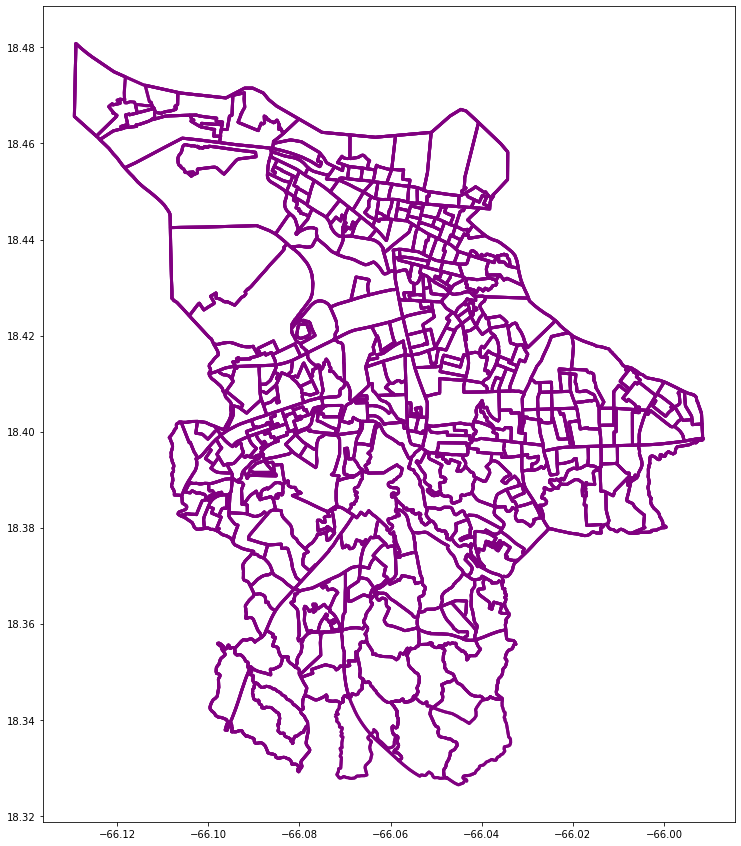

In [227]:
fig, ax = plt.subplots(figsize=(15, 15))

df.plot(ax=ax, facecolor='none', edgecolor='purple', linewidth=3)
gdf.plot(ax=ax, facecolor='none', edgecolor='purple', linewidth=3)

Okay that ran, surprisingly! But it's all crazy, so I guess I need to have a map set first (let's say "Percentage of Not Hispanic or Latin") and another ("Less than x income") and do this.

In [239]:
fig, ax =plt.subplots(figsize=(10,10)

df.plot (ax=ax,
         linewidth=0.5,
         edgecolor='grey',
         zorder=10
         
gdf.plot (ax=ax,
          edgecolor='grey',
         zorder=10

ax.axis('off')

ax.set_title('Income and Race', fontsize=24, pad=20)
          
ctx.add_basemap(ax)

SyntaxError: invalid syntax (1779410187.py, line 3)

In [240]:
#There's an error here I'm not clear about...